# Start

# Importing packages

In [31]:
# !pip install tensorflow
import tensorflow as tf
import pandas as pd
import os
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
from datetime import datetime
import shutil

from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalAveragePooling1D, Flatten, Dense, Dropout
from tensorflow.keras.layers import Rescaling, RandomFlip, RandomRotation, RandomZoom, Lambda
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split

from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications import InceptionV3

from tensorflow.keras.applications.vgg16 import preprocess_input as preprocess_input_vgg16
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_input_resnet
from tensorflow.keras.applications.inception_v3 import preprocess_input as preprocess_input_inception
# The preprocess functions from resnet50 and inception_v3 are not used bec the preprocess_input_vgg16 provided the best results.



# os.environ["TF_KERAS"]='1'
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [2]:
tf.__version__

'2.19.1'

# Data loading

In [3]:
df = pd.read_csv('../Dataset+projet+pretraitement+textes+images/Flipkart/flipkart_com-ecommerce_sample_1050.csv')
df.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


## Filtring category

In [4]:
print(df['product_category_tree'].value_counts())

product_category_tree
["Home Furnishing >> Bed Linen >> Blankets, Quilts & Dohars"]                         56
["Kitchen & Dining >> Coffee Mugs >> Prithish Coffee Mugs"]                           26
["Watches >> Wrist Watches >> Maxima Wrist Watches"]                                  23
["Kitchen & Dining >> Coffee Mugs >> Rockmantra Coffee Mugs"]                         22
["Home Furnishing >> Bath Linen >> Towels"]                                           19
                                                                                      ..
["Home Decor & Festive Needs >> Showpieces >> Ethnic >> Infinity India Ethnic"]        1
["Home Decor & Festive Needs >> Showpieces >> Ethnic >> Ravishing Variety Ethnic"]     1
["Home Decor & Festive Needs >> Showpieces >> Ethnic >> Pg handicrafts Ethnic"]        1
["Home Decor & Festive Needs >> Showpieces >> Ethnic >> Homedesires Ethnic"]           1
["Watches >> Wrist Watches >> Petrol Wrist Watches"]                                   1

In [5]:
# Inspecter la structure des données de catégorie
print(df['product_category_tree'].iloc[0])

# Nettoyer et extraire la catégorie principale
def extract_main_category(category_tree):
    if pd.isna(category_tree):
        return "Unknown"

    # Supprimer les caractères [""] et diviser par >>
    try:
        # Enlever les crochets et guillemets
        clean_tree = category_tree.strip('[]"')
        # Diviser par >>
        categories = clean_tree.split(">>")
        # Prendre la première catégorie (niveau principal) et nettoyer les espaces
        main_category = categories[0].strip()
        return main_category
    except:
        return "Error"

# Extraire la catégorie principale
df['category'] = df['product_category_tree'].apply(extract_main_category)

# Afficher les catégories principales
print(df['category'].value_counts())

["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]
category
Home Furnishing               150
Baby Care                     150
Watches                       150
Home Decor & Festive Needs    150
Kitchen & Dining              150
Beauty and Personal Care      150
Computers                     150
Name: count, dtype: int64


## Image column

Association of image paths to the DataFrame

In [6]:
# Vérification du chemin des images

image_dir = "../Dataset+projet+pretraitement+textes+images/Flipkart/Images/"
if not os.path.exists(image_dir):
    print(f"Dossier d'images introuvable. Veuillez vérifier le chemin: {image_dir}")
else:
    print(f"Dossier d'images trouvé: {image_dir}")

# Association des chemins d'images au DataFrame
df['image_path'] = df['image'].apply(lambda x: os.path.join(image_dir, x) if isinstance(x, str) else None)

# Vérification de l'existence des images
def check_image_exists(image_path):
    if image_path is None:
        return False
    return os.path.exists(image_path)

df['image_exists'] = df['image_path'].apply(check_image_exists)
print(f"Images trouvées: {df['image_exists'].sum()} sur {len(df)}")

Dossier d'images trouvé: ../Dataset+projet+pretraitement+textes+images/Flipkart/Images/
Images trouvées: 1050 sur 1050


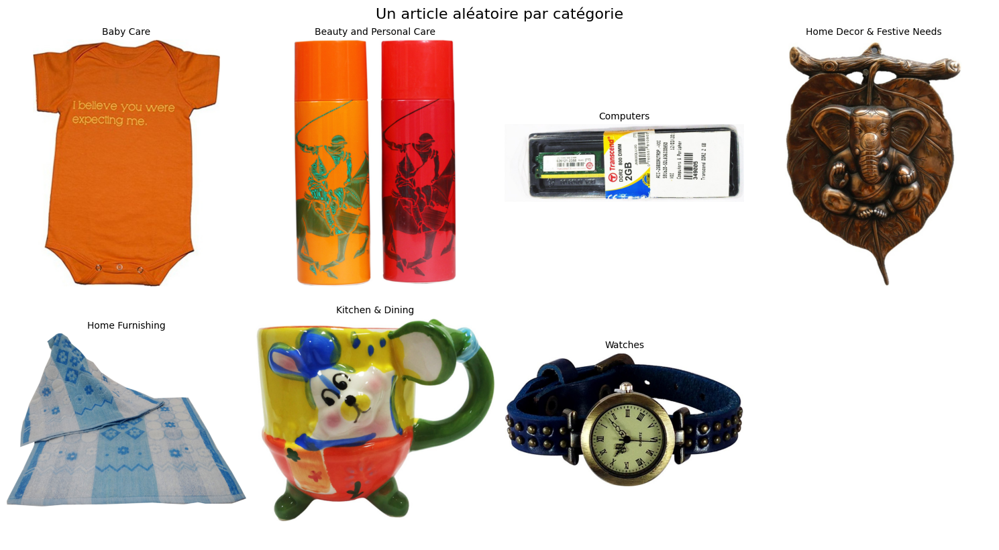

In [7]:
# Get one random sample per category from the balanced dataframe
sampled_products = df.groupby('category').sample(1, random_state=13)

# Sort categories alphabetically for consistent plot order
sampled_products = sampled_products.sort_values('category')

# Create the plot
fig, axes = plt.subplots(2, 4, figsize=(15, 8))
axes = axes.flatten() # Flatten the 2x4 grid into a 1D array of axes

for i, (index, row) in enumerate(sampled_products.iterrows()):
    image_path = row['image_path']
    category = row['category']

    try:
        img = Image.open(image_path)
        axes[i].imshow(img)
        axes[i].set_title(category, fontsize=10)
        axes[i].axis('off')
    except FileNotFoundError:
        print(f"Image not found: {image_path}")
        axes[i].set_title(f"Image Error: {category}", fontsize=10)
        axes[i].axis('off')
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        axes[i].set_title(f"Image Error: {category}", fontsize=10)
        axes[i].axis('off')


# Hide the last empty subplot
axes[-1].axis('off')

plt.tight_layout()
plt.suptitle('Un article aléatoire par catégorie', y=1.02, fontsize=16)
plt.show()


In [8]:
df = df[['pid', 'product_name', 'category', 'image_path']]
df.head()

,pid,product_name,category,image_path
0,CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet ...,Home Furnishing,../Dataset+projet+pretraitement+textes+images/...
1,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,Baby Care,../Dataset+projet+pretraitement+textes+images/...
2,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,Baby Care,../Dataset+projet+pretraitement+textes+images/...
3,BDSEJT9UQWHDUBH4,SANTOSH ROYAL FASHION Cotton Printed King size...,Home Furnishing,../Dataset+projet+pretraitement+textes+images/...
4,BDSEJTHNGWVGWWQU,Jaipur Print Cotton Floral King sized Double B...,Home Furnishing,../Dataset+projet+pretraitement+textes+images/...


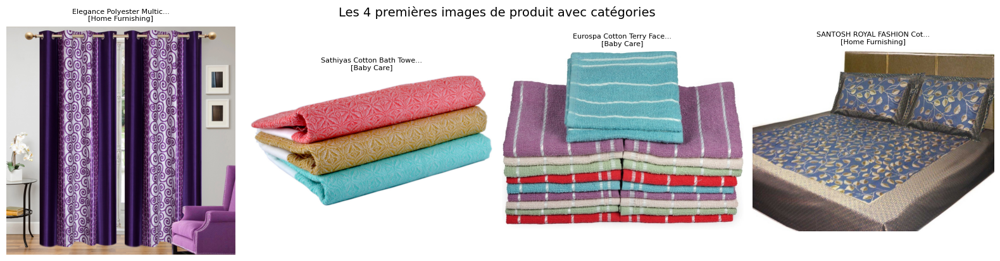

In [9]:
# Affichage des 4 premières images de produit
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

for i in range(4):
    if i < len(df):
        row = df.iloc[i]
        image_path = row['image_path']
        product_name = row['product_name']
        category = row['category']

        try:
            img = Image.open(image_path)
            axes[i].imshow(img)
            axes[i].set_title(f"{product_name[:25]}...\n[{category}]", fontsize=8)
            axes[i].axis('off')
        except FileNotFoundError:
            axes[i].text(0.5, 0.5, 'Image\nnot found', ha='center', va='center', transform=axes[i].transAxes)
            axes[i].set_title(f"{product_name[:25]}...\n[{category}]", fontsize=8)
            axes[i].axis('off')
        except Exception as e:
            axes[i].text(0.5, 0.5, f'Error:\n{str(e)[:20]}', ha='center', va='center', transform=axes[i].transAxes)
            axes[i].set_title(f"{product_name[:25]}...\n[{category}]", fontsize=8)
            axes[i].axis('off')

plt.tight_layout()
plt.suptitle('Les 4 premières images de produit avec catégories', y=1.02, fontsize=14)
plt.show()

# Split train test

## Initialize folders

In [10]:
# initialiser les répertoires d'images
import os

# Define the paths for the new directories
base_dir = '../Dataset+projet+pretraitement+textes+images/Flipkart/'
train_dir = os.path.join(base_dir, 'dataset_train')
test_dir = os.path.join(base_dir, 'dataset_test')

# Create the new directories if they don't exist
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

def clear_folder(folder_path):
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)
        try:
            if os.path.isfile(file_path):
                os.remove(file_path)
            elif os.path.isdir(file_path):  # si tu veux aussi vider les sous-dossiers
                import shutil
                shutil.rmtree(file_path)
            print(f"Supprimé : {file_path}")
        except Exception as e:
            print(f"Erreur avec {file_path}: {e}")


clear_folder(train_dir)
clear_folder(test_dir)

Supprimé : ../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\Baby Care
Supprimé : ../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\Beauty and Personal Care
Supprimé : ../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\Computers
Supprimé : ../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\Home Decor & Festive Needs
Supprimé : ../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\Home Furnishing
Supprimé : ../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\Kitchen & Dining
Supprimé : ../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\Watches
Supprimé : ../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_test\Baby Care
Supprimé : ../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_test\Beauty and Personal Care
Supprimé : ../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_test\Computers
Supprimé : ../Dataset+projet+pretraitement+te

## Copying images to respective folders

In [11]:
# Split the dataframe into training and testing sets
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42, stratify=df['category'])

# Define the paths for the new directories
base_dir = '../Dataset+projet+pretraitement+textes+images/Flipkart/'
train_dir = os.path.join(base_dir, 'dataset_train')
test_dir = os.path.join(base_dir, 'dataset_test')

train_df = train_df.copy()  # Create explicit copies
test_df = test_df.copy()

# Create the new directories if they don't exist
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Function to move images
def move_images(dataframe, destination_dir):
    for index, row in dataframe.iterrows():
        image_path = row['image_path']
        if image_path and os.path.exists(image_path):
            # Extract the filename from the image_path
            image_filename = os.path.basename(image_path)
            destination_path = os.path.join(destination_dir, image_filename)
            try:
                shutil.copy2(image_path, destination_path)
                row['image_path'] = destination_path  # Update the path in the dataframe
            except Exception as e:
                print(f"Error moving image {image_path} to {destination_path}: {e}")
        else:
            print(f"Image file not found: {image_path}")

# Move images for training set
print("Moving training images...")
move_images(train_df, train_dir)

# Move images for testing set
print("Moving testing images...")
move_images(test_df, test_dir)

# Update the 'image_path' column in the original dataframe
df['image_path'] = df.apply(
    lambda row: os.path.join(train_dir, os.path.basename(row['image_path'])) if row['pid'] in train_df['pid'].values else
                os.path.join(test_dir, os.path.basename(row['image_path'])) if row['pid'] in test_df['pid'].values else
                row['image_path'], axis=1
)


print("Dataset split, images moved, and dataframe updated successfully.")
print(f"Training images moved to: {train_dir}")
print(f"Testing images moved to: {test_dir}")

# Display the updated dataframe (optional)
display(df.head())

Moving training images...
Moving testing images...
Dataset split, images moved, and dataframe updated successfully.
Training images moved to: ../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train
Testing images moved to: ../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_test


,pid,product_name,category,image_path
0,CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet ...,Home Furnishing,../Dataset+projet+pretraitement+textes+images/...
1,BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,Baby Care,../Dataset+projet+pretraitement+textes+images/...
2,BTWEG6SHXTDB2A2Y,Eurospa Cotton Terry Face Towel Set,Baby Care,../Dataset+projet+pretraitement+textes+images/...
3,BDSEJT9UQWHDUBH4,SANTOSH ROYAL FASHION Cotton Printed King size...,Home Furnishing,../Dataset+projet+pretraitement+textes+images/...
4,BDSEJTHNGWVGWWQU,Jaipur Print Cotton Floral King sized Double B...,Home Furnishing,../Dataset+projet+pretraitement+textes+images/...


In [12]:
df['image_path'].value_counts()

image_path
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_test\55b85ea15a1536d46b7190ad6fff8ce7.jpg     1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_test\55195de3873fffaa9e37b041533d7305.jpg     1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_test\c65fa0b38ab99792630468bd7dd26416.jpg     1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\142994b421c052a6193052c6c8c3d076.jpg    1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\c6adf41cd378b1f6a7ac62675b060411.jpg    1
                                                                                                            ..
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\26989e846c2096a5b59b59cbea2cc7ab.jpg    1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\9a02f44389bda4c60e7dc23947dbca58.jpg    1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\79b78739b0ae84780001fec304ce036c

In [13]:
train_df.shape

(840, 4)

In [14]:
train_df['image_path'].value_counts()

image_path
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\5188dd28a627807407d93549580afb74.jpg    1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\799ddb97164ff2d5d53bb8b27b8c355f.jpg    1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\273982a65b9c7dabe56c8345552bfad7.jpg    1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\526cb1e7675adb39a1ea68f1f2a3fd59.jpg    1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\984983d05e18e63d1a314e86cb362ae5.jpg    1
                                                                                                            ..
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\e365b55f806e5d0abe0094a9f2590e33.jpg    1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\85fe188e1ee8237b70df0d475907bf24.jpg    1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\ed9817e8960a6a0d509061c54cfe5ac1

In [15]:
test_df.shape

(210, 4)

In [16]:
test_df['image_path'].value_counts()

image_path
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_test\3dfd14b667357e26ff6d66761cdc203f.jpg    1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_test\3aaa50eb5d2cf4c18b57346423871624.jpg    1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_test\ae03731c3482a5e42d040dbf723c49af.jpg    1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_test\ea42376c9c52752d9d01bba12eb2999b.jpg    1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_test\227fc5c4fca14c424ff33e40941d22fa.jpg    1
                                                                                                           ..
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_test\c38eb8abdaa1d8c28bc8c262761dfbc5.jpg    1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_test\219b24362655097cb41bf06a0be8ee79.jpg    1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_test\109e235d4838002246599f987d935c21.jpg    1

In [17]:
categories = df['category'].unique()
print(categories)

['Home Furnishing' 'Baby Care' 'Watches' 'Home Decor & Festive Needs'
 'Kitchen & Dining' 'Beauty and Personal Care' 'Computers']


## Organize images by category

In [18]:
# Configuration pour créer les dossiers par catégorie (si pas déjà fait)
def organize_images_by_category(df, base_path):
    """Organise les images en dossiers par catégorie"""

    # Création des dossiers par catégorie
    for category in df['category'].unique():
        category_path = os.path.join(base_path, category)
        os.makedirs(category_path, exist_ok=True)

    # Déplacer les images dans le bon dossier
    for index, row in df.iterrows():
        image_path = row['image_path']
        category = row['category']

        if image_path and os.path.exists(image_path):
            # Nom du fichier
            image_filename = os.path.basename(image_path)

            # Dossier de destination selon la catégorie
            destination_dir = os.path.join(base_path, category)
            destination_path = os.path.join(destination_dir, image_filename)

            try:
                shutil.move(image_path, destination_path)
                row['image_path'] = destination_path  # Met à jour le chemin dans le dataframe
            except Exception as e:
                print(f"Erreur lors de la copie de {image_path} vers {destination_path}: {e}")
        else:
            print(f"Image introuvable: {image_path}")

    print("Structure des dossiers créée pour les catégories:", df['category'].unique())
    print("Images copiées dans leurs dossiers respectifs.")


organize_images_by_category(train_df, train_dir)
organize_images_by_category(test_df, test_dir)

Structure des dossiers créée pour les catégories: ['Home Furnishing' 'Computers' 'Kitchen & Dining' 'Baby Care'
 'Home Decor & Festive Needs' 'Beauty and Personal Care' 'Watches']
Images copiées dans leurs dossiers respectifs.
Structure des dossiers créée pour les catégories: ['Baby Care' 'Beauty and Personal Care' 'Home Furnishing' 'Watches'
 'Home Decor & Festive Needs' 'Kitchen & Dining' 'Computers']
Images copiées dans leurs dossiers respectifs.


# Structure du dossier de projet:

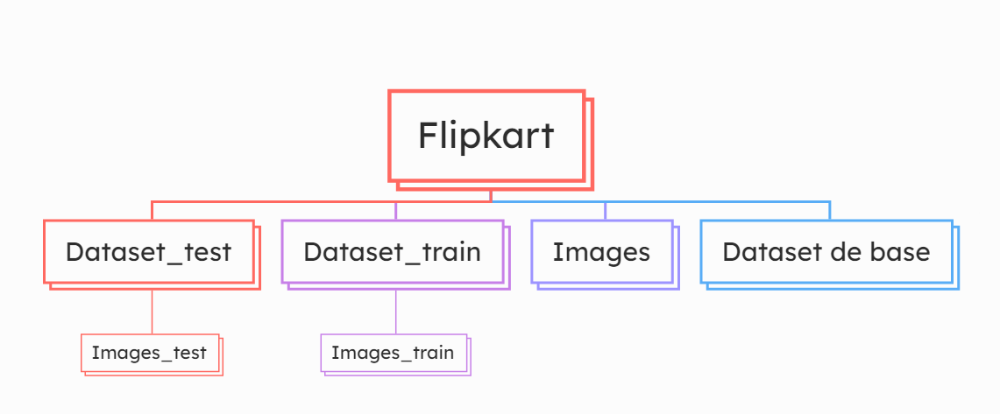

- Flipkart : [drive/MyDrive/OpenclassroomP6/Dataset+projet+pretraitement+textes+images/Flipkart](https://)

In [19]:
# Liste des variables actuelles
# df , train_df, test_df
# base_dir = 'drive/MyDrive/OpenclassroomP6/Dataset+projet+pretraitement+textes+images/Flipkart/'
# train_dir = os.path.join(base_dir, 'dataset_train')
# test_dir = os.path.join(base_dir, 'dataset_test')
# categories = df['category'].unique()


# Split train valid

In [20]:
batch_size = 32

def dataset_fct(path, validation_split=0, data_type=None) :
    dataset = tf.keras.utils.image_dataset_from_directory(
                    path, labels='inferred', label_mode='categorical',
                    class_names=None, batch_size=32, image_size=(224, 224), shuffle=True, seed=42,
                    validation_split=validation_split, subset=data_type
                    )
    return dataset

dataset_train = dataset_fct(train_dir, validation_split=0.25, data_type='training')
dataset_val = dataset_fct(train_dir, validation_split=0.25, data_type='validation')
dataset_test = dataset_fct(test_dir, validation_split=0, data_type=None)

Found 840 files belonging to 7 classes.
Using 630 files for training.
Found 840 files belonging to 7 classes.
Using 210 files for validation.
Found 210 files belonging to 7 classes.


In [21]:
import os
from PIL import Image

def check_dataset_modes(dataset_path):
    modes_count = {}
    
    for root, dirs, files in os.walk(dataset_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                path = os.path.join(root, file)
                try:
                    img = Image.open(path)
                    mode = img.mode
                    modes_count[mode] = modes_count.get(mode, 0) + 1
                except Exception as e:
                    print(f"Erreur avec {path}: {e}")

    return modes_count

# Exemple d’utilisation

modes = check_dataset_modes(train_dir)
print("train dir :", modes)
modes = check_dataset_modes(test_dir)
print("test dir :", modes)


c:\Users\kamel\Documents\Openclassroom_projets\P6\venv\Lib\site-packages\PIL\Image.py:3452: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


train dir : {'RGB': 840}
test dir : {'RGB': 210}


In [22]:
train_df['image_path'].value_counts()

image_path
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\Home Furnishing\5188dd28a627807407d93549580afb74.jpg               1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\Kitchen & Dining\799ddb97164ff2d5d53bb8b27b8c355f.jpg              1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\Kitchen & Dining\273982a65b9c7dabe56c8345552bfad7.jpg              1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\Home Furnishing\526cb1e7675adb39a1ea68f1f2a3fd59.jpg               1
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\Home Decor & Festive Needs\984983d05e18e63d1a314e86cb362ae5.jpg    1
                                                                                                                                       ..
../Dataset+projet+pretraitement+textes+images/Flipkart/dataset_train\Computers\e365b55f806e5d0abe0094a9f2590e33.jpg                     1
../Dataset+projet+pretr

# Preprocess des images

In [23]:
# import tensorflow as tf
# from tensorflow.keras.applications.vgg16 import preprocess_input

# def prepare_dataset(dataset):
#     """Applique uniquement preprocess_input (VGG16)."""

#     def _process_image(image, label):
#         # Prétraitement spécifique à VGG16
#         image = preprocess_input(image)
#         return image, label

#     return dataset.map(_process_image, num_parallel_calls=tf.data.AUTOTUNE)


# dataset_train = prepare_dataset(dataset_train)
# dataset_val = prepare_dataset(dataset_val)
# dataset_test = prepare_dataset(dataset_test)

# Optimisation
# dataset_train = dataset_train.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
# dataset_val = dataset_val.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
# dataset_test = dataset_test.cache().prefetch(buffer_size=tf.data.AUTOTUNE)


# Approche normale

## VGG16

### Création de modèle pré entrainé

Faut ajouter le verbose de la data augmentation

In [44]:
def create_VGG16_model() :
    # Data augmentation
    data_augmentation = Sequential([
        RandomFlip("horizontal", input_shape=(224, 224, 3)),
        RandomRotation(0.1),
        RandomZoom(0.1)
      ])

    # Récupération modèle pré-entraîné
    model_base = VGG16(include_top=False, weights="imagenet", input_shape=(224, 224, 3))
    model_base.trainable = False  # Geler les couches du modèle de base

    # Définition du nouveau modèle
    model = Sequential([
                data_augmentation,
                Lambda(preprocess_input_vgg16), #Rescaling(1./127.5, offset=-1),
                model_base,
                GlobalAveragePooling2D(),
                Dense(256, activation='relu'),
                Dropout(0.5),
                Dense(7, activation='softmax') # Changed to 7 to match the number of categories
                ])
    
    for layer in model.layers:
        layer.trainable = False

    # train only the last dense layer of the model
    model.layers[-1].trainable = True

    # compilation du modèle
    model.compile(loss="categorical_crossentropy", optimizer='adam', metrics=["accuracy"])

    print(model.summary())

    return model

model_vgg16 = create_VGG16_model()

# Dossier de sauvegarde
save_dir = "../Runs/VGG16"  ####
os.makedirs(save_dir, exist_ok=True)

# Nom du fichier principal (meilleur modèle unique)
best_model_path = os.path.join(save_dir, "best_model.keras")


# Fichier versionné avec validation accuracy
versioned_model_path = os.path.join(save_dir, "best_model_valAcc-{val_accuracy:.4f}.keras")

# === Recharge les meilleurs poids si existants ===
if os.path.exists(best_model_path):
    model_vgg16.load_weights(best_model_path) ####


# Callback : écrase le fichier principal
checkpoint_best = ModelCheckpoint(
    filepath=best_model_path,
    monitor="val_loss",
    verbose=1,
    save_best_only=True,
    mode="min"
)

# Callback : sauvegarde aussi une version nommée avec la val_accuracy
checkpoint_versioned = ModelCheckpoint(
    filepath=versioned_model_path,
    monitor="val_loss",
    verbose=1,
    save_best_only=True,
    mode="min"
)


# Early stopping classique
es = EarlyStopping(monitor="val_loss", mode="min", verbose=1, patience=5)

from tensorflow.keras.callbacks import ReduceLROnPlateau

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,   # divise le LR par 2
    patience=3,   # si pas d’amélioration après 3 epochs
    verbose=1
)

# Dans model.fit(..., callbacks=[checkpoint, es, reduce_lr])


# Liste des callbacks
callbacks_list = [checkpoint_best, checkpoint_versioned, es, reduce_lr]

c:\Users\kamel\Documents\Openclassroom_projets\P6\venv\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_9 (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_4 (Lambda)               │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 7)              │         1,799 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,847,815 (56.64 MB)

 Trainable params: 1,799 (7.03 KB)

 Non-trainable params: 14,846,016 (56.63 MB)

None


### Entrainement du classifieur final

In [26]:
# def prepare_dataset_1(dataset):
#     """Applique uniquement preprocess_input (VGG16)."""

#     def _process_image(image, label):
#         # Prétraitement spécifique à VGG16
#         image = preprocess_input_vgg16(image)
#         return image, label

#     return dataset.map(_process_image, num_parallel_calls=tf.data.AUTOTUNE)

# dataset_train_vgg16 = prepare_dataset_1(dataset_train)
# dataset_val_vgg16 = prepare_dataset_1(dataset_val)
# dataset_test_vgg16 = prepare_dataset_1(dataset_test)

# dataset_train_vgg16 = dataset_train_vgg16.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
# dataset_val_vgg16 = dataset_val_vgg16.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
# dataset_test_vgg16 = dataset_test_vgg16.cache().prefetch(buffer_size=tf.data.AUTOTUNE)

history = model_vgg16.fit(dataset_train,
                    validation_data=dataset_val,
                    batch_size=batch_size, epochs=50, verbose=1,callbacks=callbacks_list)

Epoch 1/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.1753 - loss: 9.8045
Epoch 1: val_loss improved from None to 4.73492, saving model to ../Runs/VGG16\best_model.keras

Epoch 1: val_loss improved from None to 4.73492, saving model to ../Runs/VGG16\best_model_valAcc-0.2619.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - accuracy: 0.1889 - loss: 9.1123 - val_accuracy: 0.2619 - val_loss: 4.7349 - learning_rate: 0.0010
Epoch 2/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2117 - loss: 7.9254
Epoch 2: val_loss improved from 4.73492 to 3.60329, saving model to ../Runs/VGG16\best_model.keras

Epoch 2: val_loss improved from 4.73492 to 3.60329, saving model to ../Runs/VGG16\best_model_valAcc-0.4048.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.2222 - loss: 7.3611 - val_accuracy: 0.4048 - val_loss: 3.6033 - learning_rate: 0.0010
Epoch 3/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2899 - loss: 5.9216
Epoch 3: val_loss improved from 3.60329 to 2.92777, s

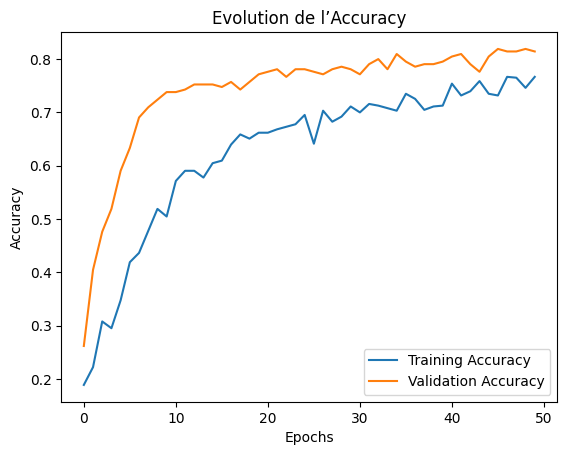

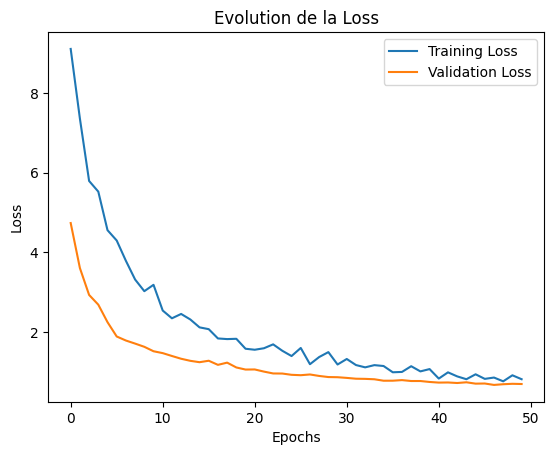

In [27]:
# --- Tracé de l'accuracy ---
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Evolution de l’Accuracy')
plt.legend()
plt.show()

# --- Tracé de la loss ---
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Evolution de la Loss')
plt.legend()
plt.show()

### Test du modele

In [ ]:
# model_vgg16.load_weights(os.path.join(save_dir,"best_model_valAcc-0.8143_testAcc-0.7667__preprocess_vgg16.keras")) ####

loss, val_accuracy = model_vgg16.evaluate(dataset_val, verbose=False) ####
print("Validation Accuracy :  {:.4f}".format(val_accuracy))
print("loss :", loss)

loss, test_accuracy = model_vgg16.evaluate(dataset_test, verbose=False) ####
print("Test Accuracy       :  {:.4f}".format(test_accuracy))
print("loss :", loss)

# === Renommage du fichier versionné correspondant ===
# Mets ici le chemin du fichier qui a servi à charger model_inception_ft
current_model_path = os.path.join(save_dir, f"best_model_valAcc-{val_accuracy:.4f}.keras")  # <-- à adapter !

if os.path.exists(current_model_path):
    name, ext = os.path.splitext(current_model_path)
    
    # éviter de renommer plusieurs fois
    if "_testAcc" not in name:
        new_model_path = f"{name}_testAcc-{test_accuracy:.4f}{ext}"
        os.rename(current_model_path, new_model_path)
        print(f"✅ Modèle renommé : {new_model_path}")
    else:
        print("↩️ Le fichier contient déjà testAcc dans son nom")
else:
    print(f"⚠️ Fichier introuvable : {current_model_path}")

c:\Users\kamel\Documents\Openclassroom_projets\P6\venv\Lib\site-packages\keras\src\saving\saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Validation Accuracy :  0.8143
loss : 0.6655933260917664
Test Accuracy       :  0.7571
loss : 1.0399582386016846
⚠️ Fichier introuvable : ../Runs/VGG16\best_model_valAcc-0.8143.keras


### **Saving tests

In [29]:
# Parcourir tous les fichiers versionnés
for filename in os.listdir(save_dir):
    filepath = os.path.join(save_dir, filename)

    # On ignore le fichier principal "best_model.keras"
    if filename == "best_model.keras":
        continue

    # Charger le modèle
    try:
        model = tf.keras.models.load_model(filepath)
    except Exception as e:
        print(f"⚠️ Impossible de charger {filename} : {e}")
        continue

    # Évaluer sur le test set
    loss, test_acc = model.evaluate(dataset_test, verbose=0)

    # Nouveau nom avec la test_accuracy
    if "_testAcc" not in filename:  # éviter de renommer plusieurs fois
        name, ext = os.path.splitext(filename)
        new_filename = f"{name}_testAcc-{test_acc:.4f}{ext}"
        new_filepath = os.path.join(save_dir, new_filename)

        # Renommer le fichier
        os.rename(filepath, new_filepath)
        print(f"✅ {filename} → {new_filename}")
    else:
        print(f"↩️ {filename} déjà annoté avec testAcc")


⚠️ Impossible de charger best_model_valAcc-0.7524.keras : <class 'keras.src.models.sequential.Sequential'> could not be deserialized properly. Please ensure that components that are Python object instances (layers, models, etc.) returned by `get_config()` are explicitly deserialized in the model's `from_config()` method.

config={'module': 'keras', 'class_name': 'Sequential', 'config': {'name': 'sequential_3', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 2542365606208}, 'layers': [{'module': 'keras.layers', 'class_name': 'InputLayer', 'config': {'batch_shape': [None, 224, 224, 3], 'dtype': 'float32', 'sparse': False, 'ragged': False, 'name': 'input_layer_5'}, 'registered_name': None}, {'module': 'keras', 'class_name': 'Sequential', 'config': {'name': 'sequential_2', 'trainable': False, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'regis

## **ResNet50

### **Création de modèle pré entrainé

In [93]:
def create_ResNet50_model():
    # Data augmentation
    data_augmentation = Sequential([
        RandomFlip("horizontal", input_shape=(224, 224, 3)),
        RandomRotation(0.1),
        RandomZoom(0.1),
    ])

    # Récupération modèle pré-entraîné
    model_base = ResNet50(include_top=False, weights="imagenet", input_shape=(224, 224, 3))
    model_base.trainable = False  # Geler les couches du modèle de base

    # Définition du nouveau modèle
    model = Sequential([
        data_augmentation,
        Lambda(preprocess_input_resnet),
        #Rescaling(1./127.5, offset=-1), # == using preprocess_input from tensorflow.keras.applications.resnet50
        model_base,
        GlobalAveragePooling2D(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(7, activation='softmax')  # 7 classes comme dans ton exemple
    ])

    # On gèle toutes les couches sauf la dernière
    for layer in model.layers:
        layer.trainable = False
    model.layers[-1].trainable = True

    # Compilation du modèle
    model.compile(loss="categorical_crossentropy", optimizer='adam', metrics=["accuracy"])

    print(model.summary())

    return model

model_resnet = create_ResNet50_model()

# Dossier de sauvegarde
save_dir = "../Runs/RESNET" ####
os.makedirs(save_dir, exist_ok=True)

# Nom du fichier principal (meilleur modèle unique)
best_model_path = os.path.join(save_dir, "best_model.keras")


# Fichier versionné avec validation accuracy
versioned_model_path = os.path.join(save_dir, "best_model_valAcc-{val_accuracy:.4f}.keras")

# === Recharge les meilleurs poids si existants ===
if os.path.exists(best_model_path):
    model_resnet.load_weights(best_model_path) ####



# Callback : écrase le fichier principal
checkpoint_best = ModelCheckpoint(
    filepath=best_model_path,
    monitor="val_loss",
    verbose=1,
    save_best_only=True,
    mode="min"
)

# Callback : sauvegarde aussi une version nommée avec la val_accuracy
checkpoint_versioned = ModelCheckpoint(
    filepath=versioned_model_path,
    monitor="val_loss",
    verbose=1,
    save_best_only=True,
    mode="min"
)


# Early stopping classique
es = EarlyStopping(monitor="val_loss", mode="min", verbose=1, patience=5)

from tensorflow.keras.callbacks import ReduceLROnPlateau

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,   # divise le LR par 2
    patience=3,   # si pas d’amélioration après 3 epochs
    verbose=1
)

# Dans model.fit(..., callbacks=[checkpoint, es, reduce_lr])


# Liste des callbacks
callbacks_list = [checkpoint_best, checkpoint_versioned, es, reduce_lr]

Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_35 (Sequential)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_17 (Lambda)              │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_17     │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 7)              │         1,799 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,114,055 (91.99 MB)

 Trainable params: 1,799 (7.03 KB)

 Non-trainable params: 24,112,256 (91.98 MB)

None


### Entrainement du classifieur final

In [94]:
# def prepare_dataset_2(dataset):
#     """Applique uniquement preprocess_input (VGG16)."""

#     def _process_image(image, label):
#         # Prétraitement spécifique à VGG16
#         image = preprocess_input_vgg16(image)
#         return image, label

#     return dataset.map(_process_image, num_parallel_calls=tf.data.AUTOTUNE)

# dataset_train_resnet = prepare_dataset_2(dataset_train)
# dataset_val_resnet = prepare_dataset_2(dataset_val)
# dataset_test_resnet = prepare_dataset_2(dataset_test)

# dataset_train_resnet = dataset_train_resnet.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
# dataset_val_resnet = dataset_val_resnet.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
# dataset_test_resnet = dataset_test_resnet.cache().prefetch(buffer_size=tf.data.AUTOTUNE)

history = model_resnet.fit(dataset_train,
                    validation_data=dataset_val,
                    batch_size=batch_size, epochs=50, verbose=1, callbacks=callbacks_list)

Epoch 1/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step - accuracy: 0.1590 - loss: 2.7124
Epoch 1: val_loss improved from None to 2.08934, saving model to ../Runs/RESNET\best_model.keras

Epoch 1: val_loss improved from None to 2.08934, saving model to ../Runs/RESNET\best_model_valAcc-0.1857.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 654ms/step - accuracy: 0.1587 - loss: 2.6666 - val_accuracy: 0.1857 - val_loss: 2.0893 - learning_rate: 0.0010
Epoch 2/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step - accuracy: 0.1937 - loss: 2.3514
Epoch 2: val_loss improved from 2.08934 to 1.82127, saving model to ../Runs/RESNET\best_model.keras

Epoch 2: val_loss improved from 2.08934 to 1.82127, saving model to ../Runs/RESNET\best_model_valAcc-0.2857.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 600ms/step - accuracy: 0.1873 - loss: 2.3334 - val_accuracy: 0.2857 - val_loss: 1.8213 - learning_rate: 0.0010
Epoch 3/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step - accuracy: 0.2519 - loss: 2.1772
Epoch 3: val_loss improved from 1.

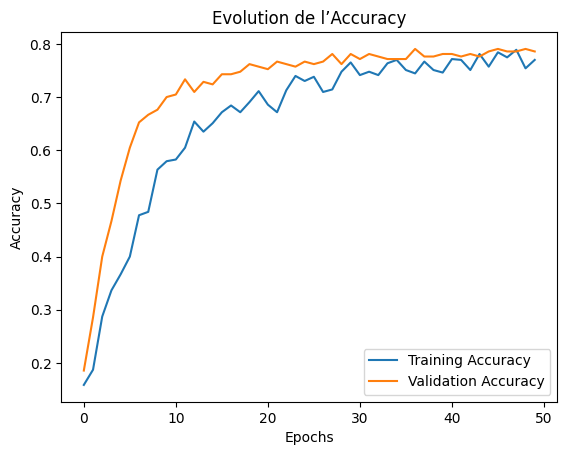

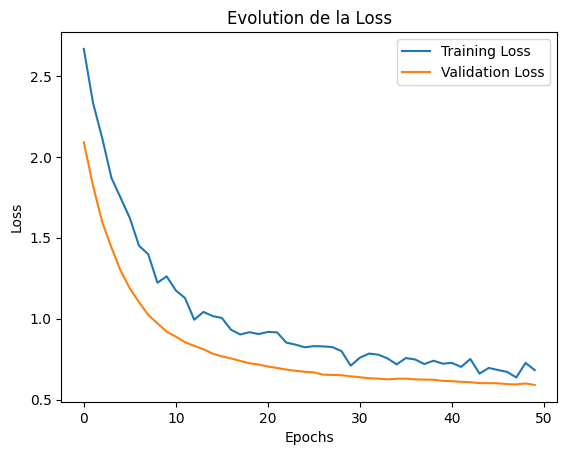

In [95]:
# --- Tracé de l'accuracy ---
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Evolution de l’Accuracy')
plt.legend()
plt.show()

# --- Tracé de la loss ---
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Evolution de la Loss')
plt.legend()
plt.show()

### **Test du modele

In [96]:
# model_resnet.load_weights(os.path.join(save_dir,"best_model_valAcc-0.8048_testAcc-0.8143.keras"))

loss, val_accuracy = model_resnet.evaluate(dataset_val, verbose=False) ####
print("Validation Accuracy :  {:.4f}".format(val_accuracy))

loss, test_accuracy = model_resnet.evaluate(dataset_test, verbose=False) ####
print("Test Accuracy       :  {:.4f}".format(test_accuracy))
print("loss :", loss)
# === Renommage du fichier versionné correspondant ===
# Mets ici le chemin du fichier qui a servi à charger model_inception_ft
current_model_path = os.path.join(save_dir, f"best_model_valAcc-{val_accuracy:.4f}.keras")  # <-- à adapter !

if os.path.exists(current_model_path):
    name, ext = os.path.splitext(current_model_path)
    
    # éviter de renommer plusieurs fois
    if "_testAcc" not in name:
        new_model_path = f"{name}_testAcc-{test_accuracy:.4f}{ext}"
        os.rename(current_model_path, new_model_path)
        print(f"✅ Modèle renommé : {new_model_path}")
    else:
        print("↩️ Le fichier contient déjà testAcc dans son nom")
else:
    print(f"⚠️ Fichier introuvable : {current_model_path}")

Validation Accuracy :  0.7857
Test Accuracy       :  0.7810
loss : 0.7240146398544312
✅ Modèle renommé : ../Runs/RESNET\best_model_valAcc-0.7857_testAcc-0.7810.keras


### **Saving tests

In [97]:
# # Parcourir tous les fichiers versionnés
# for filename in os.listdir(save_dir):
#     filepath = os.path.join(save_dir, filename)

#     # On ignore le fichier principal "best_model.keras"
#     if filename == "best_model.keras":
#         continue

#     # Charger le modèle
#     try:
#         model = tf.keras.models.load_model(filepath)
#     except Exception as e:
#         print(f"⚠️ Impossible de charger {filename} : {e}")
#         continue

#     # Évaluer sur le test set
#     loss, test_acc = model.evaluate(dataset_test, verbose=0)

#     # Nouveau nom avec la test_accuracy
#     if "_testAcc" not in filename:  # éviter de renommer plusieurs fois
#         name, ext = os.path.splitext(filename)
#         new_filename = f"{name}_testAcc-{test_acc:.4f}{ext}"
#         # Vérifier si le nouveau nom existe déjà pour éviter les conflits
#         if os.path.exists(os.path.join(save_dir, new_filename)):
#             print(f"⚠️ Le fichier {new_filename} existe déjà. Renommage ignoré pour {filename}.")
#             continue
#         new_filepath = os.path.join(save_dir, new_filename)

#         # Renommer le fichier
#         os.rename(filepath, new_filepath)
#         print(f"✅ {filename} → {new_filename}")
#     else:
#         print(f"↩️ {filename} déjà annoté avec testAcc")


## **InceptionV3

### **Création de modèle pré entrainé

In [86]:
def create_InceptionV3_model():
    # Data augmentation
    data_augmentation = Sequential([
        RandomFlip("horizontal", input_shape=(299, 299, 3)), ##
        RandomRotation(0.1),
        RandomZoom(0.1),
    ])

    # Récupération modèle pré-entraîné
    model_base = InceptionV3(include_top=False, weights="imagenet", input_shape=(299, 299, 3)) ##
    model_base.trainable = False  # Geler les couches du modèle de base

    # Définition du nouveau modèle
    model = Sequential([
        data_augmentation,
        Lambda(preprocess_input_inception),
        #Rescaling(1./127.5, offset=-1), # == using preprocess_input from tensorflow.keras.applications.inception_v3
        model_base,
        GlobalAveragePooling2D(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(7, activation='softmax')  # 7 classes
    ])

    # On gèle toutes les couches sauf la dernière
    for layer in model.layers:
        layer.trainable = False
    model.layers[-1].trainable = True

    # Compilation du modèle
    model.compile(loss="categorical_crossentropy", optimizer='adam', metrics=["accuracy"])

    print(model.summary())

    return model

model_inception = create_InceptionV3_model()

# Dossier de sauvegarde
save_dir = "../Runs/INCEPTION" ####
os.makedirs(save_dir, exist_ok=True)

# Nom du fichier principal (meilleur modèle unique)
best_model_path = os.path.join(save_dir, "best_model.keras")

# Fichier versionné avec validation accuracy
versioned_model_path = os.path.join(save_dir, "best_model_valAcc-{val_accuracy:.4f}.keras")

# === Recharge les meilleurs poids si existants ===
if os.path.exists(best_model_path):
    model_inception.load_weights(best_model_path) ####

# Callback : écrase le fichier principal
checkpoint_best = ModelCheckpoint(
    filepath=best_model_path,
    monitor="val_loss",
    verbose=1,
    save_best_only=True,
    mode="min"
)

# Callback : sauvegarde aussi une version nommée avec la val_accuracy
checkpoint_versioned = ModelCheckpoint(
    filepath=versioned_model_path,
    monitor="val_loss",
    verbose=1,
    save_best_only=True,
    mode="min"
)

# Early stopping classique
es = EarlyStopping(monitor="val_loss", mode="min", verbose=1, patience=5)

from tensorflow.keras.callbacks import ReduceLROnPlateau

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,   # divise le LR par 2
    patience=3,   # si pas d’amélioration après 3 epochs
    verbose=1
)

# Dans model.fit(..., callbacks=[checkpoint, es, reduce_lr])


# Liste des callbacks
callbacks_list = [checkpoint_best, checkpoint_versioned, es, reduce_lr]

Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_31 (Sequential)      │ (None, 299, 299, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_15 (Lambda)              │ (None, 299, 299, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (None, 8, 8, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_15     │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 7)              │         1,799 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,329,127 (85.18 MB)

 Trainable params: 1,799 (7.03 KB)

 Non-trainable params: 22,327,328 (85.17 MB)

None


### Entrainement du classifieur final

In [87]:
def dataset_fct_2(path, validation_split=0, data_type=None) :
    dataset = tf.keras.utils.image_dataset_from_directory(
                    path, labels='inferred', label_mode='categorical',
                    class_names=None, batch_size=32, image_size=(299, 299), shuffle=True, seed=42,
                    validation_split=validation_split, subset=data_type
                    )
    return dataset

dataset_train_inception = dataset_fct_2(train_dir, validation_split=0.25, data_type='training')
dataset_val_inception = dataset_fct_2(train_dir, validation_split=0.25, data_type='validation')
dataset_test_inception = dataset_fct_2(test_dir, validation_split=0, data_type=None)

history = model_inception.fit(dataset_train_inception,
                    validation_data=dataset_val_inception,
                    batch_size=batch_size, epochs=50, verbose=1, callbacks=callbacks_list)

Found 840 files belonging to 7 classes.
Using 630 files for training.
Found 840 files belonging to 7 classes.
Using 210 files for validation.
Found 210 files belonging to 7 classes.
Epoch 1/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step - accuracy: 0.1737 - loss: 2.2298
Epoch 1: val_loss improved from None to 1.84189, saving model to ../Runs/INCEPTION\best_model.keras

Epoch 1: val_loss improved from None to 1.84189, saving model to ../Runs/INCEPTION\best_model_valAcc-0.2619.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 17s 733ms/step - accuracy: 0.1730 - loss: 2.1469 - val_accuracy: 0.2619 - val_loss: 1.8419 - learning_rate: 0.0010
Epoch 2/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step - accuracy: 0.2180 - loss: 1.9729
Epoch 2: val_loss improved from 1.84189 to 1.75403, saving model to ../Runs/INCEPTION\best_model.keras

Epoch 2: val_loss improved from 1.84189 to 1.75403, saving model to ../Runs/INCEPTION\best_model_valAcc-0.4333.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 14s 697ms/step - accuracy: 0.2238 - loss:

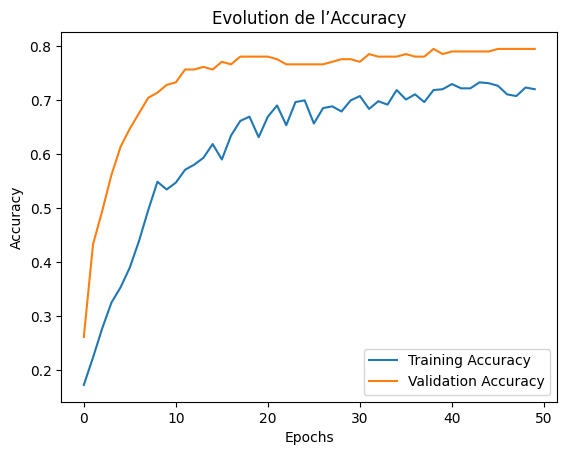

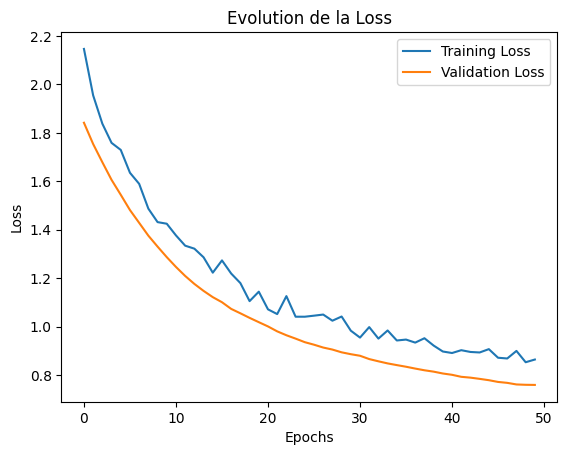

In [88]:
# --- Tracé de l'accuracy ---
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Evolution de l’Accuracy')
plt.legend()
plt.show()

# --- Tracé de la loss ---
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Evolution de la Loss')
plt.legend()
plt.show()

### **Test du modele

In [89]:
import os

# model_inception.load_weights("../Runs/INCEPTION/best_model_valAcc-0.7619_testAcc-0.7952.keras")

loss, val_accuracy = model_inception.evaluate(dataset_val_inception, verbose=False) ####
print("Validation Accuracy :  {:.4f}".format(val_accuracy))

loss, test_accuracy = model_inception.evaluate(dataset_test_inception, verbose=False) ####
print("Test Accuracy       :  {:.4f}".format(test_accuracy))
print("loss :", loss)
# === Renommage du fichier versionné correspondant ===
# Mets ici le chemin du fichier qui a servi à charger model_inception_ft
current_model_path = os.path.join(save_dir, f"best_model_valAcc-{val_accuracy:.4f}.keras")  # <-- à adapter !

if os.path.exists(current_model_path):
    name, ext = os.path.splitext(current_model_path)
    
    # éviter de renommer plusieurs fois
    if "_testAcc" not in name:
        new_model_path = f"{name}_testAcc-{test_accuracy:.4f}{ext}"
        os.rename(current_model_path, new_model_path)
        print(f"✅ Modèle renommé : {new_model_path}")
    else:
        print("↩️ Le fichier contient déjà testAcc dans son nom")
else:
    print(f"⚠️ Fichier introuvable : {current_model_path}")

Validation Accuracy :  0.7952
Test Accuracy       :  0.7619
loss : 0.8310979008674622
✅ Modèle renommé : ../Runs/INCEPTION\best_model_valAcc-0.7952_testAcc-0.7619.keras


### **Saving tests

In [90]:
# Parcourir tous les fichiers versionnés
for filename in os.listdir(save_dir):
    filepath = os.path.join(save_dir, filename)

    # On ignore le fichier principal "best_model.keras"
    if filename == "best_model.keras":
        continue

    # Charger le modèle
    try:
        model = tf.keras.models.load_model(filepath)
    except Exception as e:
        print(f"⚠️ Impossible de charger {filename} : {e}")
        continue

    # Évaluer sur le test set
    loss, test_acc = model.evaluate(dataset_test, verbose=0)

    # Nouveau nom avec la test_accuracy
    if "_testAcc" not in filename:  # éviter de renommer plusieurs fois
        name, ext = os.path.splitext(filename)
        new_filename = f"{name}_testAcc-{test_acc:.4f}{ext}"
        new_filepath = os.path.join(save_dir, new_filename)

        # Renommer le fichier
        os.rename(filepath, new_filepath)
        print(f"✅ {filename} → {new_filename}")
    else:
        print(f"↩️ {filename} déjà annoté avec testAcc")


⚠️ Impossible de charger best_model_valAcc-0.7619_testAcc-0.7952.keras : <class 'keras.src.models.sequential.Sequential'> could not be deserialized properly. Please ensure that components that are Python object instances (layers, models, etc.) returned by `get_config()` are explicitly deserialized in the model's `from_config()` method.

config={'module': 'keras', 'class_name': 'Sequential', 'config': {'name': 'sequential_8', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 2542365606208}, 'layers': [{'module': 'keras.layers', 'class_name': 'InputLayer', 'config': {'batch_shape': [None, 224, 224, 3], 'dtype': 'float32', 'sparse': False, 'ragged': False, 'name': 'input_layer_13'}, 'registered_name': None}, {'module': 'keras', 'class_name': 'Sequential', 'config': {'name': 'sequential_7', 'trainable': False, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'f

# Approche Fine tunning

## VGG16ft

### Création de modèle pré entrainé

In [ ]:
def create_VGG16_model_2() :
    # Data augmentation
    data_augmentation = Sequential([
        RandomFlip("horizontal", input_shape=(224, 224, 3)),
        RandomRotation(0.1),
        RandomZoom(0.1)
      ])

    # Récupération modèle pré-entraîné
    model_base = VGG16(include_top=False, weights="imagenet", input_shape=(224, 224, 3))
    for layer in model_base.layers: # Geler les couches du modèle de base
        layer.trainable = False

    # Définition du nouveau modèle
    model = Sequential([
                data_augmentation,
                Lambda(preprocess_input_vgg16),
                model_base,
                GlobalAveragePooling2D(),
                Dense(256, activation='relu'),
                Dropout(0.5),
                Dense(7, activation='softmax') # Changed to 7 to match the number of categories
                ])

    # compilation du modèle
    model.compile(loss="categorical_crossentropy", optimizer='adam', metrics=["accuracy"])

    print(model.summary())

    return model

# Création du modèle
model_vgg16_ft = create_VGG16_model_2()

# Dossier de sauvegarde
save_dir = "../Runs/VGG16ft"  ####
os.makedirs(save_dir, exist_ok=True)

# Nom du fichier principal (meilleur modèle unique)
best_model_path = os.path.join(save_dir, "best_model.keras")


# Fichier versionné avec validation accuracy
versioned_model_path = os.path.join(save_dir, "best_model_valAcc-{val_accuracy:.4f}.keras")

# === Recharge les meilleurs poids si existants ===
if os.path.exists(best_model_path):
    model_vgg16_ft.load_weights(best_model_path) ####


# Callback : écrase le fichier principal
checkpoint_best = ModelCheckpoint(
    filepath=best_model_path,
    monitor="val_loss",
    verbose=1,
    save_best_only=True,
    mode="min"
)

# Callback : sauvegarde aussi une version nommée avec la val_accuracy
checkpoint_versioned = ModelCheckpoint(
    filepath=versioned_model_path,
    monitor="val_loss",
    verbose=1,
    save_best_only=True,
    mode="min"
)


# Early stopping classique
es = EarlyStopping(monitor="val_loss", mode="min", verbose=1, patience=5)

from tensorflow.keras.callbacks import ReduceLROnPlateau

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,   # divise le LR par 2
    patience=6,   # si pas d’amélioration après 3 epochs
    verbose=1
)

# Liste des callbacks
callbacks_list = [checkpoint_best, checkpoint_versioned, es, reduce_lr]

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_15 (Sequential)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_7 (Lambda)               │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_7      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 7)              │         1,799 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,847,815 (56.64 MB)

 Trainable params: 133,127 (520.03 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

None


### Entrainement du modèle

In [54]:
history = model_vgg16_ft.fit(dataset_train,
                    validation_data=dataset_val,
                    batch_size=batch_size, epochs=50, verbose=1, callbacks=callbacks_list)

Epoch 1/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2962 - loss: 6.2641
Epoch 1: val_loss improved from None to 1.23458, saving model to ../Runs/VGG16ft\best_model.keras

Epoch 1: val_loss improved from None to 1.23458, saving model to ../Runs/VGG16ft\best_model_valAcc-0.7714.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - accuracy: 0.3921 - loss: 5.0053 - val_accuracy: 0.7714 - val_loss: 1.2346 - learning_rate: 0.0010
Epoch 2/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6409 - loss: 2.2946
Epoch 2: val_loss improved from 1.23458 to 0.93101, saving model to ../Runs/VGG16ft\best_model.keras

Epoch 2: val_loss improved from 1.23458 to 0.93101, saving model to ../Runs/VGG16ft\best_model_valAcc-0.8143.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - accuracy: 0.6667 - loss: 1.8897 - val_accuracy: 0.8143 - val_loss: 0.9310 - learning_rate: 0.0010
Epoch 3/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7393 - loss: 1.1613
Epoch 3: val_loss improved from 0.93101 to 0.

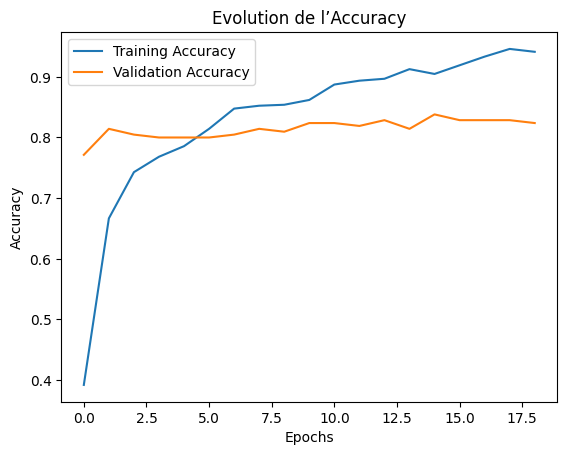

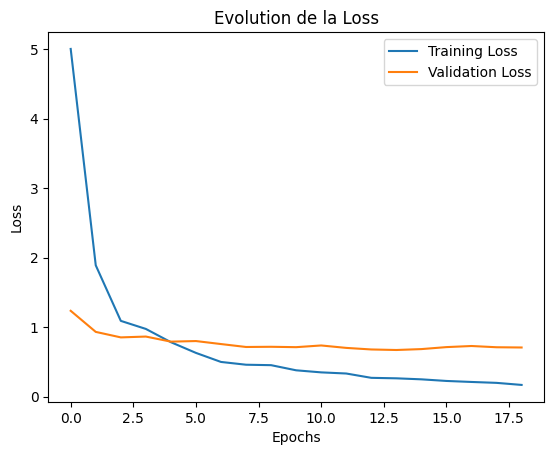

In [55]:
# --- Tracé de l'accuracy ---
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Evolution de l’Accuracy')
plt.legend()
plt.show()

# --- Tracé de la loss ---
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Evolution de la Loss')
plt.legend()
plt.show()

### Test du modele

In [56]:
# === Ton code de test ===
loss, val_accuracy = model_vgg16_ft.evaluate(dataset_val, verbose=False) ####
print("Validation Accuracy :  {:.4f}".format(val_accuracy))

loss, test_accuracy = model_vgg16_ft.evaluate(dataset_test, verbose=False) ####
print("Test Accuracy       :  {:.4f}".format(test_accuracy))
print("loss :", loss)
# === Renommage du fichier versionné correspondant ===
# Mets ici le chemin du fichier qui a servi à charger model_inception_ft
current_model_path = os.path.join(save_dir, f"best_model_valAcc-{val_accuracy:.4f}.keras")  # <-- à adapter !

if os.path.exists(current_model_path):
    name, ext = os.path.splitext(current_model_path)
    
    # éviter de renommer plusieurs fois
    if "_testAcc" not in name:
        new_model_path = f"{name}_testAcc-{test_accuracy:.4f}{ext}"
        os.rename(current_model_path, new_model_path)
        print(f"✅ Modèle renommé : {new_model_path}")
    else:
        print("↩️ Le fichier contient déjà testAcc dans son nom")
else:
    print(f"⚠️ Fichier introuvable : {current_model_path}")


Validation Accuracy :  0.8238
Test Accuracy       :  0.7619
loss : 1.2339974641799927
✅ Modèle renommé : ../Runs/VGG16ft\best_model_valAcc-0.8238_testAcc-0.7619.keras


### **Saving tests

In [ ]:
# # Parcourir tous les fichiers versionnés
# for filename in os.listdir(save_dir):
#     filepath = os.path.join(save_dir, filename)

#     # On ignore le fichier principal "best_model.keras"
#     if filename == "best_model.keras":
#         continue

#     # Charger le modèle
#     try:
#         model = tf.keras.models.load_model(filepath)
#     except Exception as e:
#         print(f"⚠️ Impossible de charger {filename} : {e}")
#         continue

#     # Évaluer sur le test set
#     loss, test_acc = model.evaluate(dataset_test, verbose=0)

#     # Nouveau nom avec la test_accuracy
#     if "_testAcc" not in filename:  # éviter de renommer plusieurs fois
#         name, ext = os.path.splitext(filename)
#         new_filename = f"{name}_testAcc-{test_acc:.4f}{ext}"
#         new_filepath = os.path.join(save_dir, new_filename)

#         # Renommer le fichier
#         os.rename(filepath, new_filepath)
#         print(f"✅ {filename} → {new_filename}")
#     else:
#         print(f"↩️ {filename} déjà annoté avec testAcc")


⚠️ Impossible de charger best_model_valAcc-0.7714.keras : <class 'keras.src.models.sequential.Sequential'> could not be deserialized properly. Please ensure that components that are Python object instances (layers, models, etc.) returned by `get_config()` are explicitly deserialized in the model's `from_config()` method.

config={'module': 'keras', 'class_name': 'Sequential', 'config': {'name': 'sequential_16', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 2542365606208}, 'layers': [{'module': 'keras.layers', 'class_name': 'InputLayer', 'config': {'batch_shape': [None, 224, 224, 3], 'dtype': 'float32', 'sparse': False, 'ragged': False, 'name': 'input_layer_25'}, 'registered_name': None}, {'module': 'keras', 'class_name': 'Sequential', 'config': {'name': 'sequential_15', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'reg

## **ResNet50ft

### **Création du modèle

In [ ]:
def create_ResNet50_model_2():
    # Data augmentation
    data_augmentation = Sequential([
        RandomFlip("horizontal", input_shape=(224, 224, 3)),
        RandomRotation(0.1),
        RandomZoom(0.1)
    ])

    # Récupération modèle pré-entraîné
    model_base = ResNet50(include_top=False, weights="imagenet", input_shape=(224, 224, 3))
    model_base.trainable = False  # Geler les couches du modèle de base

    # Définition du nouveau modèle
    model = Sequential([
        data_augmentation,
        Lambda(preprocess_input_resnet),
        model_base,
        GlobalAveragePooling2D(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(7, activation='softmax')  # 7 classes comme dans ton exemple
    ])

    # Compilation du modèle
    model.compile(loss="categorical_crossentropy", optimizer='adam', metrics=["accuracy"])

    print(model.summary())

    return model


model_resnet_ft = create_ResNet50_model_2()


# Dossier de sauvegarde
save_dir = "../Runs/RESNETft" ####
os.makedirs(save_dir, exist_ok=True)

# Nom du fichier principal (meilleur modèle unique)
best_model_path = os.path.join(save_dir, "best_model.keras")


# Fichier versionné avec validation accuracy
versioned_model_path = os.path.join(save_dir, "best_model_valAcc-{val_accuracy:.4f}.keras")

# === Recharge les meilleurs poids si existants ===
if os.path.exists(best_model_path):
    model_resnet_ft.load_weights(best_model_path) ####


# Callback : écrase le fichier principal
checkpoint_best = ModelCheckpoint(
    filepath=best_model_path,
    monitor="val_loss",
    verbose=1,
    save_best_only=True,
    mode="min"
)

# Callback : sauvegarde aussi une version nommée avec la val_accuracy
checkpoint_versioned = ModelCheckpoint(
    filepath=versioned_model_path,
    monitor="val_loss",
    verbose=1,
    save_best_only=True,
    mode="min"
)


# Early stopping classique
es = EarlyStopping(monitor="val_loss", mode="min", verbose=1, patience=5)

from tensorflow.keras.callbacks import ReduceLROnPlateau

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,   # divise le LR par 2
    patience=6,   # si pas d’amélioration après 3 epochs
    verbose=1
)

# Liste des callbacks
callbacks_list = [checkpoint_best, checkpoint_versioned, es, reduce_lr]

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_17 (Sequential)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_8 (Lambda)               │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_8      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 7)              │         1,799 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,114,055 (91.99 MB)

 Trainable params: 526,343 (2.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

None


### **Entrainement du modèle

In [59]:
model_resnet_ft.optimizer.learning_rate=1e-5

In [60]:
history = model_resnet_ft.fit(dataset_train,
                    validation_data=dataset_val,
                    batch_size=batch_size, epochs=50, verbose=1, callbacks=callbacks_list)

Epoch 1/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step - accuracy: 0.1300 - loss: 3.2280
Epoch 1: val_loss improved from None to 2.74878, saving model to ../Runs/RESNETft\best_model.keras

Epoch 1: val_loss improved from None to 2.74878, saving model to ../Runs/RESNETft\best_model_valAcc-0.1095.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 673ms/step - accuracy: 0.1238 - loss: 3.1819 - val_accuracy: 0.1095 - val_loss: 2.7488 - learning_rate: 1.0000e-05
Epoch 2/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step - accuracy: 0.1214 - loss: 3.0331
Epoch 2: val_loss improved from 2.74878 to 2.49165, saving model to ../Runs/RESNETft\best_model.keras

Epoch 2: val_loss improved from 2.74878 to 2.49165, saving model to ../Runs/RESNETft\best_model_valAcc-0.1286.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 612ms/step - accuracy: 0.1206 - loss: 2.8853 - val_accuracy: 0.1286 - val_loss: 2.4916 - learning_rate: 1.0000e-05
Epoch 3/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step - accuracy: 0.1687 - loss: 2.6411
Epoch 3: val_loss 

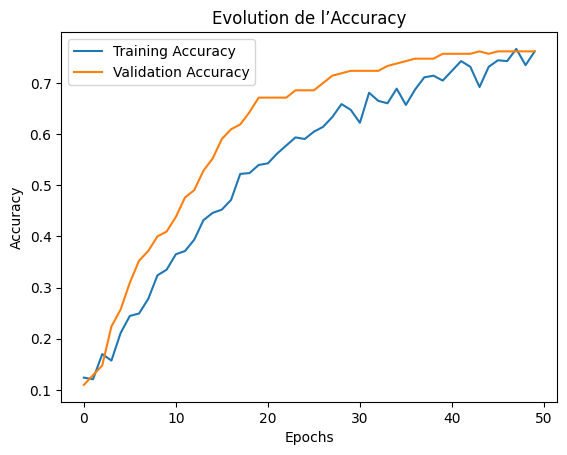

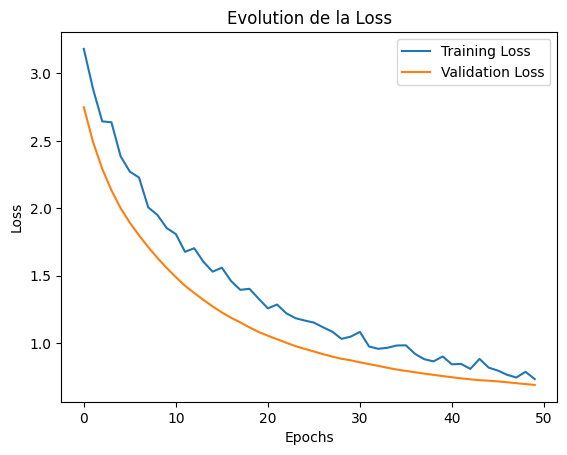

In [61]:
# --- Tracé de l'accuracy ---
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Evolution de l’Accuracy')
plt.legend()
plt.show()

# --- Tracé de la loss ---
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Evolution de la Loss')
plt.legend()
plt.show()

### **Test du modele

In [62]:
# === Ton code de test ===
loss, val_accuracy = model_resnet_ft.evaluate(dataset_val, verbose=False) ####
print("Validation Accuracy :  {:.4f}".format(val_accuracy))

loss, test_accuracy = model_resnet_ft.evaluate(dataset_test, verbose=False) ####
print("Test Accuracy       :  {:.4f}".format(test_accuracy))
print("loss :", loss)
# === Renommage du fichier versionné correspondant ===
# Mets ici le chemin du fichier qui a servi à charger model_inception_ft
current_model_path = os.path.join(save_dir, f"best_model_valAcc-{val_accuracy:.4f}.keras")  # <-- à adapter !

if os.path.exists(current_model_path):
    name, ext = os.path.splitext(current_model_path)
    
    # éviter de renommer plusieurs fois
    if "_testAcc" not in name:
        new_model_path = f"{name}_testAcc-{test_accuracy:.4f}{ext}"
        os.rename(current_model_path, new_model_path)
        print(f"✅ Modèle renommé : {new_model_path}")
    else:
        print("↩️ Le fichier contient déjà testAcc dans son nom")
else:
    print(f"⚠️ Fichier introuvable : {current_model_path}")


Validation Accuracy :  0.7619
Test Accuracy       :  0.7667
loss : 0.800075113773346
✅ Modèle renommé : ../Runs/RESNETft\best_model_valAcc-0.7619_testAcc-0.7667.keras


### **Saving tests

In [ ]:
# # Parcourir tous les fichiers versionnés
# for filename in os.listdir(save_dir):
#     filepath = os.path.join(save_dir, filename)

#     # On ignore le fichier principal "best_model.keras"
#     if filename == "best_model.keras":
#         continue

#     # Charger le modèle
#     try:
#         model = tf.keras.models.load_model(filepath)
#     except Exception as e:
#         print(f"⚠️ Impossible de charger {filename} : {e}")
#         continue

#     # Évaluer sur le test set
#     loss, test_acc = model.evaluate(dataset_test, verbose=0)

#     # Nouveau nom avec la test_accuracy
#     if "_testAcc" not in filename:  # éviter de renommer plusieurs fois
#         name, ext = os.path.splitext(filename)
#         new_filename = f"{name}_testAcc-{test_acc:.4f}{ext}"
#         new_filepath = os.path.join(save_dir, new_filename)

#         # Renommer le fichier
#         os.rename(filepath, new_filepath)
#         print(f"✅ {filename} → {new_filename}")
#     else:
#         print(f"↩️ {filename} déjà annoté avec testAcc")


⚠️ Impossible de charger best_model_valAcc-0.1095.keras : <class 'keras.src.models.sequential.Sequential'> could not be deserialized properly. Please ensure that components that are Python object instances (layers, models, etc.) returned by `get_config()` are explicitly deserialized in the model's `from_config()` method.

config={'module': 'keras', 'class_name': 'Sequential', 'config': {'name': 'sequential_18', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None, 'shared_object_id': 2542365606208}, 'layers': [{'module': 'keras.layers', 'class_name': 'InputLayer', 'config': {'batch_shape': [None, 224, 224, 3], 'dtype': 'float32', 'sparse': False, 'ragged': False, 'name': 'input_layer_28'}, 'registered_name': None}, {'module': 'keras', 'class_name': 'Sequential', 'config': {'name': 'sequential_17', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'reg

## **InceptionV3ft

### **Création du modèle

In [ ]:
def create_InceptionV3_model_2():
    # Data augmentation
    data_augmentation = Sequential([
        RandomFlip("horizontal", input_shape=(224, 224, 3)),
        RandomRotation(0.1),
        RandomZoom(0.1)
    ])

    # Récupération modèle pré-entraîné
    model_base = InceptionV3(include_top=False, weights="imagenet", input_shape=(224, 224, 3))
    model_base.trainable = False  # Geler les couches du modèle de base

    # Définition du nouveau modèle
    model = Sequential([
        data_augmentation,
        Lambda(preprocess_input_inception),
        model_base,
        GlobalAveragePooling2D(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(7, activation='softmax')  # 7 classes
    ])

    # Compilation du modèle
    model.compile(loss="categorical_crossentropy", optimizer='adam', metrics=["accuracy"])

    print(model.summary())

    return model

model_inception_ft = create_InceptionV3_model_2()

# Dossier de sauvegarde
save_dir = "../Runs/INCEPTIONft" ####
os.makedirs(save_dir, exist_ok=True)

# Nom du fichier principal (meilleur modèle unique)
best_model_path = os.path.join(save_dir, "best_model.keras")

# Fichier versionné avec validation accuracy
versioned_model_path = os.path.join(save_dir, "best_model_valAcc-{val_accuracy:.4f}.keras")

# === Recharge les meilleurs poids si existants ===
if os.path.exists(best_model_path):
    model_inception_ft.load_weights(best_model_path) ####


# Callback : écrase le fichier principal
checkpoint_best = ModelCheckpoint(
    filepath=best_model_path,
    monitor="val_loss",
    verbose=1,
    save_best_only=True,
    mode="min"
)

# Callback : sauvegarde aussi une version nommée avec la val_accuracy
checkpoint_versioned = ModelCheckpoint(
    filepath=versioned_model_path,
    monitor="val_loss",
    verbose=1,
    save_best_only=True,
    mode="min"
)


# Early stopping classique
es = EarlyStopping(monitor="val_loss", mode="min", verbose=1, patience=5)

from tensorflow.keras.callbacks import ReduceLROnPlateau

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,   # divise le LR par 2
    patience=3,   # si pas d’amélioration après 3 epochs
    verbose=1
)

# Liste des callbacks
callbacks_list = [checkpoint_best, checkpoint_versioned, es, reduce_lr]

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_19 (Sequential)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_9 (Lambda)               │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (None, 5, 5, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_9      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 7)              │         1,799 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,329,127 (85.18 MB)

 Trainable params: 526,343 (2.01 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

None


### **Entrainement du modèle

In [65]:
history = model_inception_ft.fit(dataset_train,
                    validation_data=dataset_val,
                    batch_size=batch_size, epochs=50, verbose=1, callbacks=callbacks_list)

Epoch 1/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.3775 - loss: 1.9852
Epoch 1: val_loss improved from None to 0.77735, saving model to ../Runs/INCEPTIONft\best_model.keras

Epoch 1: val_loss improved from None to 0.77735, saving model to ../Runs/INCEPTIONft\best_model_valAcc-0.7286.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 446ms/step - accuracy: 0.4714 - loss: 1.6456 - val_accuracy: 0.7286 - val_loss: 0.7773 - learning_rate: 0.0010
Epoch 2/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - accuracy: 0.7374 - loss: 0.7830
Epoch 2: val_loss improved from 0.77735 to 0.65356, saving model to ../Runs/INCEPTIONft\best_model.keras

Epoch 2: val_loss improved from 0.77735 to 0.65356, saving model to ../Runs/INCEPTIONft\best_model_valAcc-0.7714.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 406ms/step - accuracy: 0.7397 - loss: 0.7735 - val_accuracy: 0.7714 - val_loss: 0.6536 - learning_rate: 0.0010
Epoch 3/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - accuracy: 0.7948 - loss: 0.6490
Epoch 3: val_lo

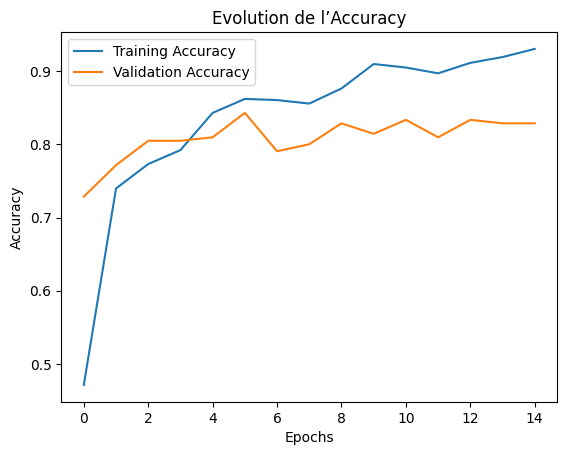

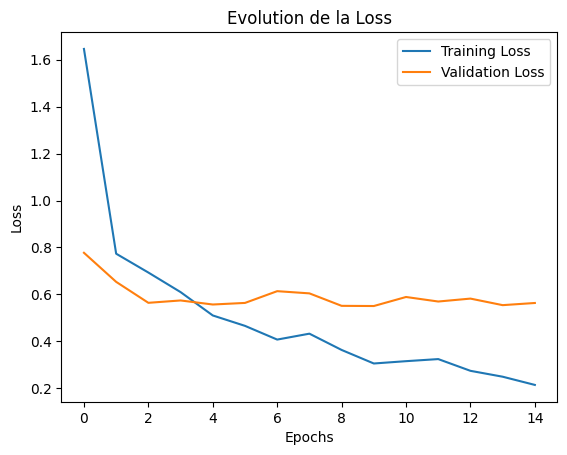

In [66]:
# --- Tracé de l'accuracy ---
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Evolution de l’Accuracy')
plt.legend()
plt.show()

# --- Tracé de la loss ---
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Evolution de la Loss')
plt.legend()
plt.show()

### **Test du modele

et ajouter la valeur de l'accuracy de test dans le nom du fichier des poids du modèle

In [67]:
import os

# === Ton code de test ===
loss, val_accuracy = model_inception_ft.evaluate(dataset_val, verbose=False) ####
print("Validation Accuracy :  {:.4f}".format(val_accuracy))

loss, test_accuracy = model_inception_ft.evaluate(dataset_test, verbose=False) ####
print("Test Accuracy       :  {:.4f}".format(test_accuracy))
print("loss :", loss)
# === Renommage du fichier versionné correspondant ===
# Mets ici le chemin du fichier qui a servi à charger model_inception_ft
current_model_path = os.path.join(save_dir, f"best_model_valAcc-{val_accuracy:.4f}.keras")  # <-- à adapter !

if os.path.exists(current_model_path):
    name, ext = os.path.splitext(current_model_path)
    
    # éviter de renommer plusieurs fois
    if "_testAcc" not in name:
        new_model_path = f"{name}_testAcc-{test_accuracy:.4f}{ext}"
        os.rename(current_model_path, new_model_path)
        print(f"✅ Modèle renommé : {new_model_path}")
    else:
        print("↩️ Le fichier contient déjà testAcc dans son nom")
else:
    print(f"⚠️ Fichier introuvable : {current_model_path}")



Validation Accuracy :  0.8286
Test Accuracy       :  0.8190
loss : 0.4978732168674469
✅ Modèle renommé : ../Runs/INCEPTIONft\best_model_valAcc-0.8286_testAcc-0.8190.keras


### **Saving tests

Renommer tous les fichiers de poids de modèle en ajoutant la valeur de test accuracy

In [ ]:
# # Parcourir tous les fichiers versionnés
# for filename in os.listdir(save_dir):
#     filepath = os.path.join(save_dir, filename)

#     # On ignore le fichier principal "best_model.keras"
#     if filename == "best_model.keras":
#         continue

#     # Charger le modèle
#     try:
#         model = tf.keras.models.load_model(filepath)
#     except Exception as e:
#         print(f"⚠️ Impossible de charger {filename} : {e}")
#         continue

#     # Évaluer sur le test set
#     loss, test_acc = model.evaluate(dataset_test, verbose=0)

#     # Nouveau nom avec la test_accuracy
#     if "_testAcc" not in filename:  # éviter de renommer plusieurs fois
#         name, ext = os.path.splitext(filename)
#         new_filename = f"{name}_testAcc-{test_acc:.4f}{ext}"
#         new_filepath = os.path.join(save_dir, new_filename)

#         # Renommer le fichier
#         os.rename(filepath, new_filepath)
#         print(f"✅ {filename} → {new_filename}")
#     else:
#         print(f"↩️ {filename} déjà annoté avec testAcc")


# Benchmark models

<div style="display: flex;">
  <div style="flex: 1; padding: 10px;">
    <!-- Tableau 1 -->
    <table>
      <tr><th>Approche normale</th></tr>
      <tr><td>Models</td><td>Val accuracy</td><td>Test accuracy</td><td>Test loss</td></tr>
      <tr><td>VGG16</td><td>0.8143</td><td>0.7667</td><td>1.0399</td></tr>
      <tr><td>RESNET50</td><td>0.7857</td><td>0.7810</td><td>0.7240</td></tr>
      <tr><td>INCEPTIONV3</td><td>0.7952</td><td>0.7619</td><td>0.8310</td></tr>
    </table>
  </div>
  <div style="flex: 1; padding: 10px;">
    <!-- Tableau 2 -->
    <table>
      <tr><th>Approche fine tuning</th></tr>
      <tr><td>Models</td><td>Val accuracy</td><td>Test accuracy</td><td>Test loss</td></tr>
      <tr><td>VGG16ft</td><td>0.8238</td><td>0.7619</td><td>1.2339</td></tr>
      <tr><td>RESNET50ft</td><td>0.7619</td><td>0.7667</td><td>0.8000</td></tr>
      <tr><td>INCEPTIONV3ft</td><td>0.8286</td><td>0.8190</td><td>0.4978</td></tr>
    </table>
  </div>
</div>




# End